In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
from sklearn import preprocessing

In [2]:
data_raw = pd.read_excel('data.xlsx', index_col=0)

data_trim = data_raw[['text','text_without_emoji','parent_id','#idea','#question','#help','#frustrated','#interested',
                               '#confused','#useful','#curious','Paragraph_Text','CE_label','Confusion_label']]

for i in range(len(data_trim)):
    if not isinstance(data_trim['text_without_emoji'][i], str):
        data_trim = data_trim.drop(i)
        
# Remove entries with only hashtags
data_trim.reset_index(drop=True, inplace=True)

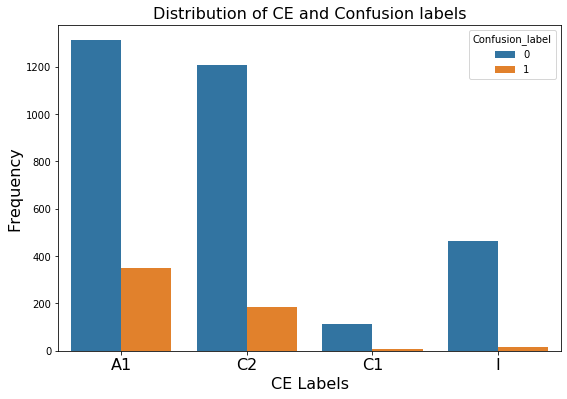

In [33]:
# Distribution of CE and Confusion labels

plt.figure(figsize=(9, 6))

sns.countplot(x='CE_label', hue='Confusion_label', data=data_trim)

plt.title('Distribution of CE and Confusion labels',size=16)
plt.ylabel('Frequency',size=16)
plt.xlabel('CE Labels',size=16)
plt.xticks(size=16)

plt.savefig('orig_labels.png')

plt.show()

In [4]:
data_trim.insert(12,'My_CE',0,True)

data_trim.loc[data_trim['CE_label'] == 'C1', 'My_CE'] = 'C1/C2'
data_trim.loc[data_trim['CE_label'] == 'C2', 'My_CE'] = 'C1/C2'
data_trim.loc[data_trim['CE_label'] == 'I', 'My_CE'] = 'I'
data_trim.loc[data_trim['CE_label'] == 'A1', 'My_CE'] = 'A1'

data_trim

,text,text_without_emoji,parent_id,#idea,#question,#help,#frustrated,#interested,#confused,#useful,#curious,Paragraph_Text,My_CE,CE_label,Confusion_label
0,When an element has a high electronegativity v...,When an element has a high electronegativity v...,NaN,1,0,0,0,0,0,0,0,A description of how Pauling electronegativity...,A1,A1,0
1,The higher the electronegativity difference be...,The higher the electronegativity difference be...,NaN,0,0,0,0,0,0,0,1,Ionic bonds are electrostatic interactions for...,A1,A1,0
2,"personally, I think chemistry is the science o...","personally, I think chemistry is the science o...",NaN,0,0,0,0,0,0,0,0,"In BIS2A, we are concerned primarily with deve...",C1/C2,C2,0
3,#interested it is possible that electrostatic ...,it is possible that electrostatic fields are ...,NaN,0,0,0,0,1,0,0,0,The discussion of bond types above highlights ...,C1/C2,C2,0
4,There are two three types of bonds discussed i...,There are two three types of bonds discussed i...,NaN,0,0,0,0,0,0,0,0,NaN,A1,A1,0
5,The positive ion would be referred to as the c...,The positive ion would be referred to as the c...,NaN,1,0,0,0,0,0,0,0,Ionic bonds are electrostatic interactions for...,A1,A1,0
6,I think the 1.8 difference in electronegativit...,I think the 1.8 difference in electronegativit...,NaN,0,1,0,0,0,0,0,1,We can interpret the electron transfer above u...,C1/C2,C2,0
7,Understanding the properties of the materials ...,Understanding the properties of the materials ...,NaN,0,0,0,0,1,0,0,0,"In BIS2A, we are concerned primarily with deve...",A1,A1,0
8,An example of this is the shape (structure) of...,An example of this is the shape (structure) of...,NaN,0,0,0,0,0,0,0,0,Each macromolecule plays a specific role in th...,A1,A1,0
9,Noble gases are not very reactive because they...,Noble gases are not very reactive because they...,NaN,0,0,0,0,0,0,1,0,The different elements are organized and displ...,A1,A1,0


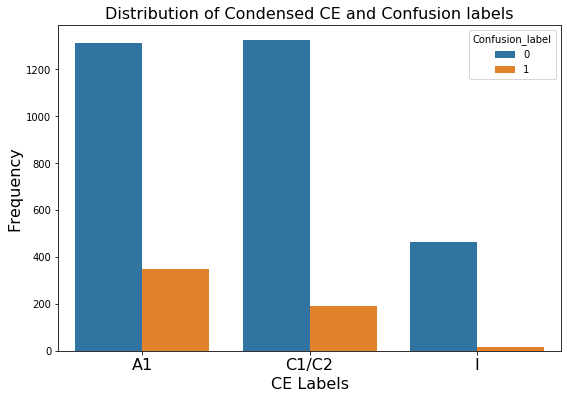

In [34]:
# Distribution of Condensed CE and Confusion labels

plt.figure(figsize=(9, 6))

sns.countplot(x='My_CE', hue='Confusion_label', data=data_trim)

plt.title('Distribution of Condensed CE and Confusion labels',size=16)
plt.ylabel('Frequency',size=16)
plt.xlabel('CE Labels',size=16)
plt.xticks(size=16)

plt.savefig('new_labels.png')

plt.show()

In [29]:
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

def prepross(i):
    # Tokenisation
    tk = re.split(r'\W+', data_trim['text_without_emoji'][i])
            
    tokens = [t for t in tk if t != '']

    # Case Folding
    lower_toks = list(map(lambda x: x.lower(), tokens))


    # Stopping
    stop_words = set(stopwords.words('english'))
    terms = []

    for w in lower_toks:
        if w not in stop_words:
            terms.append(w)
        
    # Normalisation
    for i in range(len(terms)):
        terms[i] = ps.stem(terms[i])
        
    return terms

ps = PorterStemmer()
vocab = {}

for i in range(len(data_trim)):
    
    terms = prepross(i)
        
    # Add to vocab
    for t in terms:
        if t not in vocab:
            vocab[t] = 1
        else:
            vocab[t] += 1
    
vocab

{'element': 207,
 'high': 133,
 'electroneg': 269,
 'valu': 58,
 'like': 366,
 'fluorin': 12,
 'coval': 133,
 'bond': 948,
 'would': 587,
 'take': 111,
 'electron': 322,
 'higher': 77,
 'differ': 601,
 'two': 241,
 'ion': 170,
 'stronger': 47,
 'ionic': 150,
 'low': 61,
 'make': 327,
 'weak': 55,
 'person': 16,
 'think': 338,
 'chemistri': 81,
 'scienc': 8,
 'matter': 44,
 'biolog': 94,
 'thing': 148,
 'work': 75,
 'chang': 234,
 'bind': 63,
 'greatli': 6,
 'possibl': 76,
 'electrostat': 7,
 'field': 4,
 'strong': 72,
 'enough': 62,
 'affect': 76,
 'type': 173,
 'molecul': 721,
 'rule': 19,
 'dissolv': 24,
 'might': 67,
 'appli': 18,
 'time': 120,
 'three': 40,
 'discuss': 95,
 'section': 15,
 'hydrogen': 288,
 'weakest': 8,
 'made': 108,
 'transfer': 82,
 'occur': 173,
 'opposit': 49,
 'charg': 200,
 'give': 76,
 'posit': 123,
 'neg': 162,
 'comparison': 15,
 'occurr': 1,
 'share': 59,
 'atom': 392,
 'electrongeta': 1,
 'zero': 9,
 'refer': 101,
 'cation': 12,
 'anion': 12,
 '1': 90,


In [7]:
term_mat = {}
vocab_ts = list(vocab.keys())

for i in range(len(data_trim)):
    temp = []
    for j in range(len(vocab.keys())):
        
        if vocab_ts[j] in data_trim['text_without_emoji'][i]:
            temp.append(1)
        else:
            temp.append(0)
    term_mat[i] = temp
            
term_mat

{0: [1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  

In [54]:
# Baseline data
term_df = pd.DataFrame.from_dict(term_mat)
term_df = term_df.transpose()
CE = pd.DataFrame(data_trim['My_CE'])

# Encode CE
le = preprocessing.LabelEncoder()
CE_encoded = CE.apply(le.fit_transform)
term_df['CE'] = CE_encoded

term_df.head()

,0,1,2,3,4,5,6,7,8,9,...,5266,5267,5268,5269,5270,5271,5272,5273,5274,CE
0,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
1,0,1,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,1,0,0,0,0,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0


In [65]:
# Split data
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import f1_score, cohen_kappa_score, accuracy_score

X = term_df.drop('CE',axis=1)
y = term_df['CE']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=100)

In [26]:
# Logistic Regression - Baseline
lr = LogisticRegression(random_state=100,multi_class='multinomial')
lr_parameters = {'solver':('saga', 'lbfgs'), 'C':[1, 2, 3]}
lr_gridCV = GridSearchCV(lr,lr_parameters,cv=5)
lr_gridCV.fit(X_train, y_train)

/home/tom/miniconda3/lib/python3.7/site-packages/sklearn/linear_model/sag.py:337: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/tom/miniconda3/lib/python3.7/site-packages/sklearn/linear_model/sag.py:337: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/tom/miniconda3/lib/python3.7/site-packages/sklearn/linear_model/sag.py:337: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/tom/miniconda3/lib/python3.7/site-packages/sklearn/linear_model/sag.py:337: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/home/tom/miniconda3/lib/python3.7/site-packages/sklearn/linear_model/sag.py:337: ConvergenceWarning: The max_iter was reached w

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100,
                                          multi_class='multinomial',
                                          n_jobs=None, penalty='l2',
                                          random_state=100, solver='warn',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'C': [1, 2, 3], 'solver': ('saga', 'lbfgs')},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [32]:
lr_model = LogisticRegression(C=1,solver='saga',random_state=100,multi_class='multinomial').fit(X_train, y_train)
lr_preds = lr_model.predict(X_test)

lr_acc = lr_model.score(X_test, y_test)
lr_f1 = f1_score(y_test, lr_preds, average='weighted')
lr_kappa = cohen_kappa_score(y_test, lr_preds)

"LR model:   Accuracy: {0:2.3f}, F1 score: {1:2.3f}, Kappa: {2:2.3f}".format(lr_acc,lr_f1,lr_kappa)

/home/tom/miniconda3/lib/python3.7/site-packages/sklearn/linear_model/sag.py:337: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


'LR model:   Accuracy: 0.519, F1 score: 0.515, Kappa: 0.202'

In [66]:
# Decision Tree Classifier - Baseline
dt_model = DecisionTreeClassifier(random_state=100).fit(X_train, y_train)
dt_preds = dt_model.predict(X_test)

dt_acc = dt_model.score(X_test, y_test)
dt_f1 = f1_score(y_test, dt_preds, average='weighted')
dt_kappa = cohen_kappa_score(y_test, dt_preds)

"DT model:   Accuracy: {0:2.3f}, F1 score: {1:2.3f}, Kappa: {2:2.3f}".format(dt_acc,dt_f1,dt_kappa)

'DT model:   Accuracy: 0.472, F1 score: 0.470, Kappa: 0.131'

In [68]:
# Random Forest Classifier - Baseline
rf = RandomForestClassifier(n_estimators=200,max_depth=4,random_state=100).fit(X_train, y_train)
rf_preds = rf.predict(X_test)

rf_acc = rf.score(X_test, y_test)
rf_f1 = f1_score(y_test, rf_preds, average='weighted')
rf_kappa = cohen_kappa_score(y_test, rf_preds)

"RF model:   Accuracy: {0:2.3f}, F1 score: {1:2.3f}, Kappa: {2:2.3f}".format(dt_acc,dt_f1,dt_kappa)

/home/tom/miniconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


'RF model:   Accuracy: 0.472, F1 score: 0.470, Kappa: 0.131'

In [ ]:
# SVM Linear Classifier - Baseline
# NB: add validation set and tweak: kernel type and parameter C
svm_parameters = {'kernel':('linear', 'rbf'), 'C':[1, 2]}
svm = SVC(random_state=100,gamma='scale')
svm_gridCV = GridSearchCV(svm, svm_parameters, cv=5)
svm_gridCV.fit(X_train, y_train)

In [20]:
svm = SVC(C=1,kernel='rbf',random_state=100,gamma='scale')
svm.fit(X_train,y_train)
svm_preds = svm.predict(X_test)

svm_acc = accuracy_score(y_test, svm_preds)
svm_f1 = f1_score(y_test, svm_preds, average='weighted')
svm_kappa = cohen_kappa_score(y_test, svm_preds)

"SVM model:   Accuracy: {0:2.3f}, F1 score: {1:2.3f}, Kappa: {2:2.3f}".format(svm_acc,svm_f1,svm_kappa)

/home/tom/miniconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


'SVM model:   Accuracy: 0.554, F1 score: 0.510, Kappa: 0.220'